**GradCAM**

78864416/78864416 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


Image path: /content/ham10000/ham10000_images_part_2/ISIC_0030375.jpg
Image shape: (380, 380, 3), Min: 0.0470588244497776, Max: 0.843137264251709
Heatmap shape: (380, 380, 3), Min: 0, Max: 255
Superimposed image shape: (380, 380, 3), Min: 0.0784313753247261, Max: 1.0525490045547485


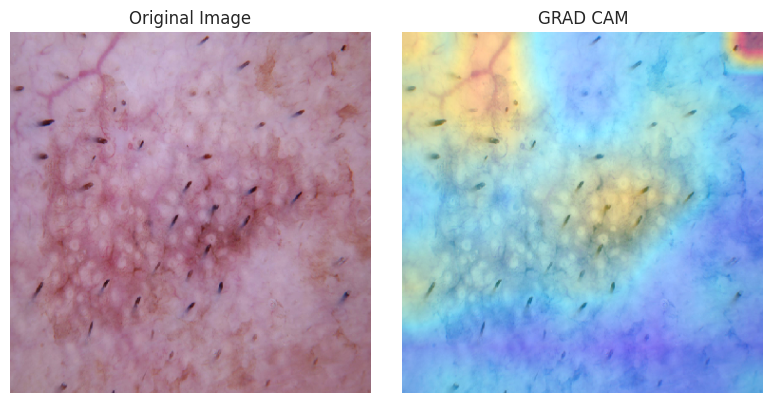

Image path: /content/ham10000/ham10000_images_part_2/ISIC_0029897.jpg
Image shape: (380, 380, 3), Min: 0.0, Max: 1.0
Heatmap shape: (380, 380, 3), Min: 0, Max: 255
Superimposed image shape: (380, 380, 3), Min: 0.0, Max: 1.2000000476837158


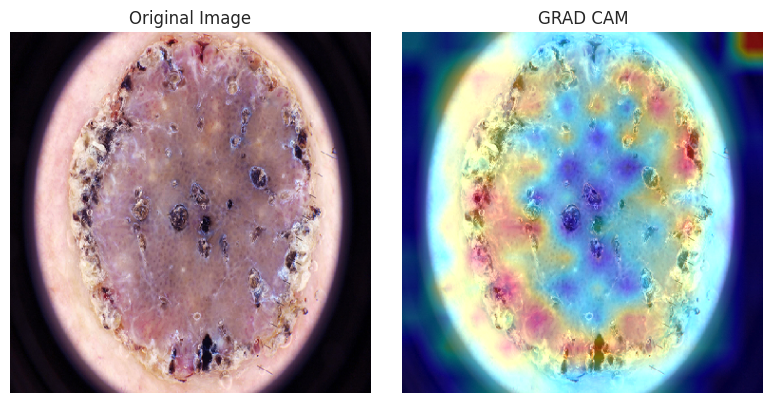

Image path: /content/ham10000/ham10000_images_part_2/ISIC_0033857.jpg
Image shape: (380, 380, 3), Min: 0.0, Max: 0.8588235378265381
Heatmap shape: (380, 380, 3), Min: 0, Max: 255
Superimposed image shape: (380, 380, 3), Min: 0.0, Max: 1.0337255001068115


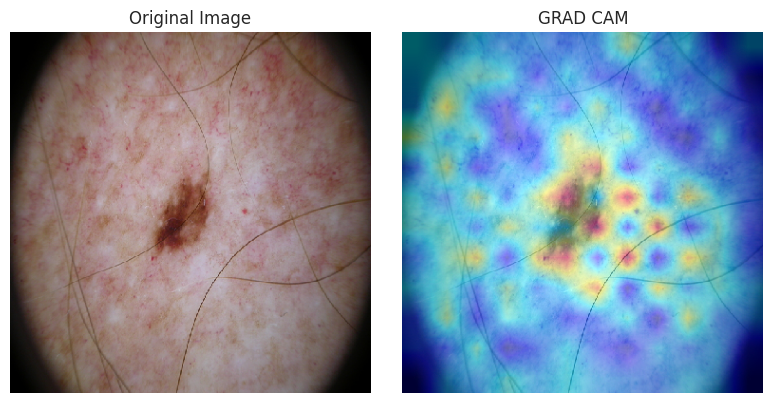

Image path: /content/ham10000/ham10000_images_part_2/ISIC_0033837.jpg
Image shape: (380, 380, 3), Min: 0.007843137718737125, Max: 0.9764705896377563
Heatmap shape: (380, 380, 3), Min: 0, Max: 255
Superimposed image shape: (380, 380, 3), Min: 0.0501960813999176, Max: 1.1811764240264893


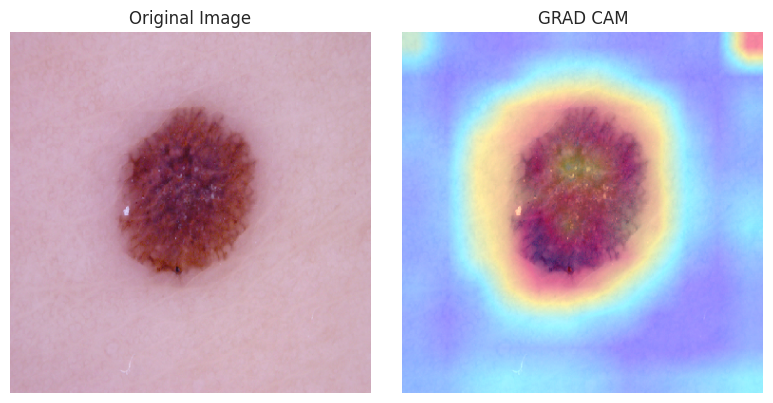

Image path: /content/ham10000/ham10000_images_part_2/ISIC_0031485.jpg
Image shape: (380, 380, 3), Min: 0.03921568766236305, Max: 0.7529411911964417
Heatmap shape: (380, 380, 3), Min: 0, Max: 255
Superimposed image shape: (380, 380, 3), Min: 0.0533333346247673, Max: 1.0023529529571533


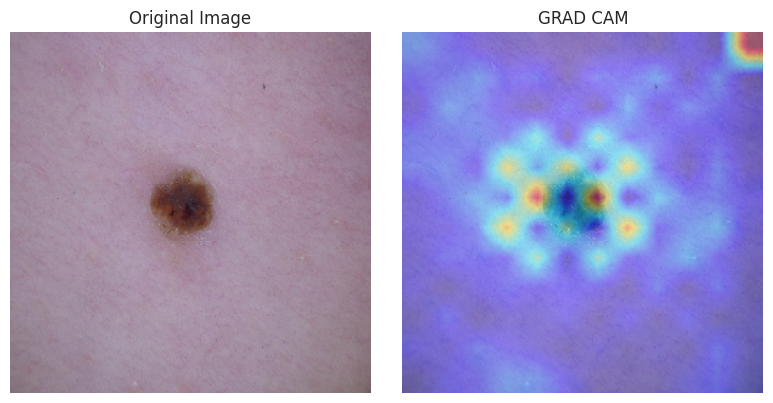

In [ ]:
import os
import numpy as np
import cv2
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
from glob import glob

# Improved grad_cam function with Guided Backpropagation
def grad_cam(model, img_path, layer_name, class_idx, preprocess_input):
    img = image.load_img(img_path, target_size=(380, 380))
    img = image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = preprocess_input(img)

    grad_model = Model([model.inputs], [model.get_layer(layer_name).output, model.output])
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img)
        loss = predictions[:, class_idx]

    grads = tape.gradient(loss, conv_outputs)
    guided_grads = tf.cast(conv_outputs > 0, 'float32') * tf.cast(grads > 0, 'float32') * grads
    pooled_grads = tf.reduce_mean(guided_grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]

    conv_outputs = conv_outputs.numpy()
    pooled_grads = pooled_grads.numpy()

    for i in range(pooled_grads.shape[-1]):
        conv_outputs[:, :, i] *= pooled_grads[i]

    heatmap = np.mean(conv_outputs, axis=-1)
    heatmap = np.maximum(heatmap, 0)

    # Increase heatmap intensity
    heatmap /= np.max(heatmap)
    heatmap = np.uint8(255 * heatmap)

    return heatmap

# Define image directory and other parameters
base_skin_dir = '/content/ham10000'
image_paths = glob(os.path.join(base_skin_dir, '*', '*.jpg'))
class_index = 5  # Replace with the index of the class for which you want to visualize GRAD CAM

# Preprocess input image function
preprocess_func = tf.keras.applications.efficientnet.preprocess_input

# Load pre-trained EfficientNet model
model = tf.keras.models.load_model("/content/Quantized_Student.tflite")
last_conv_layer_name = 'top_conv'  # EfficientNetB4's last conv layer name

# Process up to 5 images and display
num_images_to_display = 5
num_images_processed = 0

for img_path in image_paths:
    try:
        # Compute GRAD CAM
        cam = grad_cam(model, img_path, last_conv_layer_name, class_index, preprocess_func)

        # Normalize the original image for display
        img = image.load_img(img_path, target_size=(380, 380))
        img = image.img_to_array(img)
        img = img.astype(np.float32) / 255.0

        # Resize the heatmap to match the image size
        heatmap = cv2.resize(cam, (img.shape[1], img.shape[0]))

        # Enhance the color intensity of the heatmap
        heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

        # Adjust the blending ratio to make the original image more visible
        superimposed_img = cv2.addWeighted(img, 0.8, heatmap.astype('float32') / 255.0, 0.4, 0)

        # Print debugging information
        print(f"Image path: {img_path}")
        print(f"Image shape: {img.shape}, Min: {np.min(img)}, Max: {np.max(img)}")
        print(f"Heatmap shape: {heatmap.shape}, Min: {np.min(heatmap)}, Max: {np.max(heatmap)}")
        print(f"Superimposed image shape: {superimposed_img.shape}, Min: {np.min(superimposed_img)}, Max: {np.max(superimposed_img)}")

        # Display the original image and GRAD CAM
        plt.figure(figsize=(8, 4))
        plt.subplot(1, 2, 1)
        plt.imshow(img)
        plt.title('Original Image')
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB))
        plt.title('GRAD CAM')
        plt.axis('off')

        plt.tight_layout()
        plt.show()

        num_images_processed += 1
        if num_images_processed >= num_images_to_display:
            break

    except Exception as e:
        print(f"Error processing image {img_path}: {e}")
        continue


Image path: /content/ham10000/HAM10000_images_part_1/ISIC_0028628.jpg
Image shape: (380, 380, 3), Min: 0.0941176488995552, Max: 0.8549019694328308
Heatmap shape: (380, 380, 3), Min: 0, Max: 255
Superimposed image shape: (380, 380, 3), Min: 0.1129411831498146, Max: 1.0807843208312988


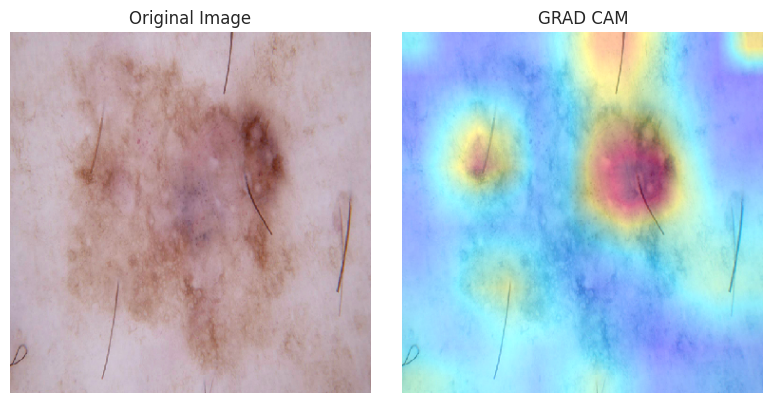

Image path: /content/ham10000/HAM10000_images_part_1/ISIC_0025099.jpg
Image shape: (380, 380, 3), Min: 0.03529411926865578, Max: 0.800000011920929
Heatmap shape: (380, 380, 3), Min: 0, Max: 255
Superimposed image shape: (380, 380, 3), Min: 0.02823529578745365, Max: 0.9803921580314636


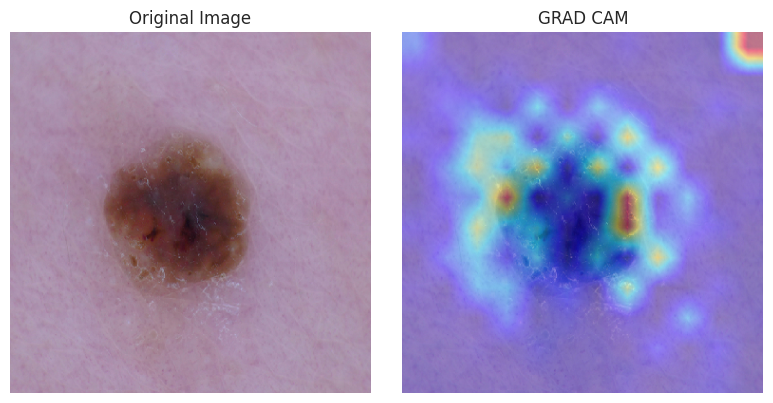

Image path: /content/ham10000/HAM10000_images_part_1/ISIC_0027260.jpg
Image shape: (380, 380, 3), Min: 0.0, Max: 0.8196078538894653
Heatmap shape: (380, 380, 3), Min: 0, Max: 255
Superimposed image shape: (380, 380, 3), Min: 0.0376470610499382, Max: 1.0399999618530273


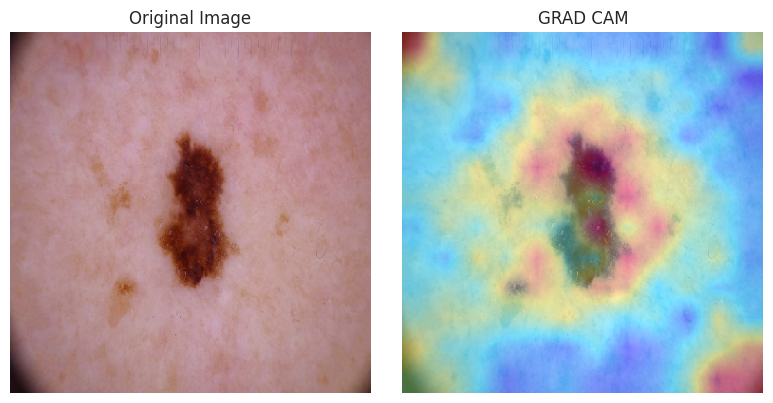

Image path: /content/ham10000/ham10000_images_part_1/ISIC_0028666.jpg
Image shape: (380, 380, 3), Min: 0.0, Max: 0.8705882430076599
Heatmap shape: (380, 380, 3), Min: 0, Max: 255
Superimposed image shape: (380, 380, 3), Min: 0.0, Max: 1.0870587825775146


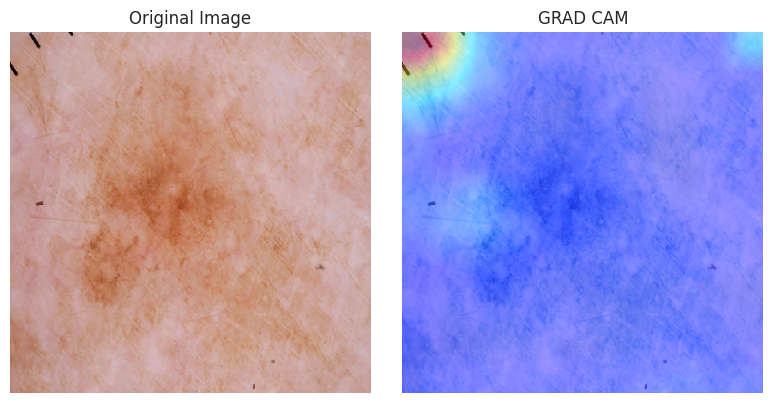

Image path: /content/ham10000/HAM10000_images_part_1/ISIC_0027309.jpg
Image shape: (380, 380, 3), Min: 0.20000000298023224, Max: 0.9921568632125854
Heatmap shape: (380, 380, 3), Min: 0, Max: 255
Superimposed image shape: (380, 380, 3), Min: 0.169411763548851, Max: 1.1905882358551025


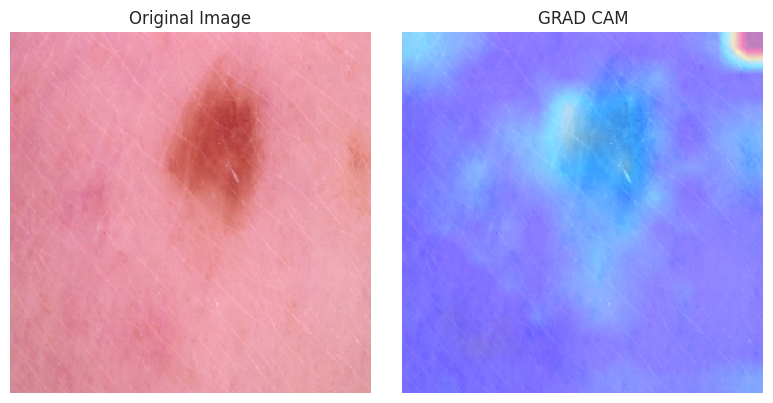

In [ ]:
import os
import numpy as np
import cv2
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
from glob import glob
import random

# Improved grad_cam function with Guided Backpropagation
def grad_cam(model, img_path, layer_name, class_idx, preprocess_input):
    img = image.load_img(img_path, target_size=(380, 380))
    img = image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = preprocess_input(img)

    grad_model = Model([model.inputs], [model.get_layer(layer_name).output, model.output])
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img)
        loss = predictions[:, class_idx]

    grads = tape.gradient(loss, conv_outputs)
    guided_grads = tf.cast(conv_outputs > 0, 'float32') * tf.cast(grads > 0, 'float32') * grads
    pooled_grads = tf.reduce_mean(guided_grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]

    conv_outputs = conv_outputs.numpy()
    pooled_grads = pooled_grads.numpy()

    for i in range(pooled_grads.shape[-1]):
        conv_outputs[:, :, i] *= pooled_grads[i]

    heatmap = np.mean(conv_outputs, axis=-1)
    heatmap = np.maximum(heatmap, 0)

    # Increase heatmap intensity
    heatmap /= np.max(heatmap)
    heatmap = np.uint8(255 * heatmap)

    return heatmap

# Define image directory and other parameters
base_skin_dir = '/content/ham10000'
image_paths = glob(os.path.join(base_skin_dir, '*', '*.jpg'))
class_index = 5  # Replace with the index of the class for which you want to visualize GRAD CAM

# Preprocess input image function
preprocess_func = tf.keras.applications.efficientnet.preprocess_input

# Load pre-trained EfficientNet model
model = tf.keras.models.load_model("/content/Quantized_Student.tflite")
last_conv_layer_name = 'top_conv'  # EfficientNetB4's last conv layer name

# Select random image paths for processing
random.shuffle(image_paths)  # Shuffle the image paths

# Process up to 5 images and display
num_images_to_display = 5
num_images_processed = 0

for img_path in image_paths:
    try:
        # Compute GRAD CAM
        cam = grad_cam(model, img_path, last_conv_layer_name, class_index, preprocess_func)

        # Normalize the original image for display
        img = image.load_img(img_path, target_size=(380, 380))
        img = image.img_to_array(img)
        img = img.astype(np.float32) / 255.0

        # Resize the heatmap to match the image size
        heatmap = cv2.resize(cam, (img.shape[1], img.shape[0]))

        # Enhance the color intensity of the heatmap
        heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

        # Adjust the blending ratio to make the original image more visible
        superimposed_img = cv2.addWeighted(img, 0.8, heatmap.astype('float32') / 255.0, 0.4, 0)

        # Print debugging information
        print(f"Image path: {img_path}")
        print(f"Image shape: {img.shape}, Min: {np.min(img)}, Max: {np.max(img)}")
        print(f"Heatmap shape: {heatmap.shape}, Min: {np.min(heatmap)}, Max: {np.max(heatmap)}")
        print(f"Superimposed image shape: {superimposed_img.shape}, Min: {np.min(superimposed_img)}, Max: {np.max(superimposed_img)}")

        # Display the original image and GRAD CAM
        plt.figure(figsize=(8, 4))
        plt.subplot(1, 2, 1)
        plt.imshow(img)
        plt.title('Original Image')
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB))
        plt.title('GRAD CAM')
        plt.axis('off')

        plt.tight_layout()
        plt.show()

        num_images_processed += 1
        if num_images_processed >= num_images_to_display:
            break  # Stop after displaying the required number of images

    except Exception as e:
        print(f"Error processing image {img_path}: {e}")
        continue


**LIME**

In [ ]:
pip install lime

In [ ]:
pip install numpy matplotlib lime scikit-image keras

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=774fd7997f9f5b72127eafde8550388437b4ed2482d2923c50b7df75674fd06e
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


Lime

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━

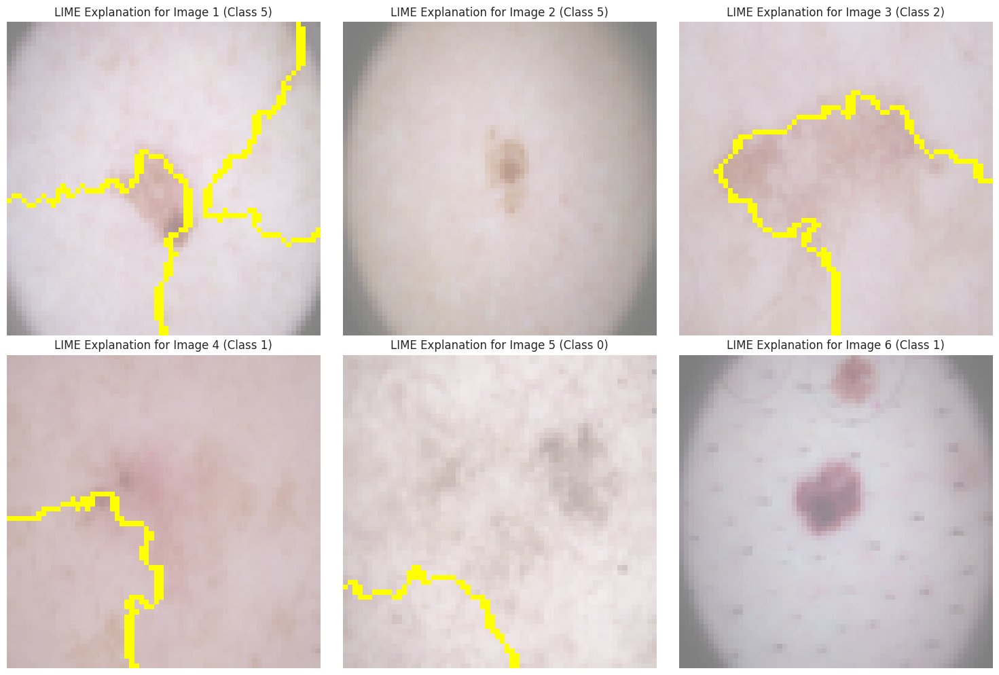

In [ ]:
import numpy as np
from lime import lime_image
from skimage.segmentation import mark_boundaries
import matplotlib.pyplot as plt

# Initialize the LIME Image Explainer
explainer = lime_image.LimeImageExplainer()

# Function to display LIME explanations for a specific number of images
def display_lime_explanations(images, model, num_images=6):
    plt.figure(figsize=(15, 10))  # Figure size for a 2x3 grid layout

    for i in range(num_images):
        # Select an image to explain
        image = images[i]

        # Generate the LIME explanation
        explanation = explainer.explain_instance(
            image,
            classifier_fn=lambda x: model.predict(x),  # Model prediction function
            top_labels=3,
            hide_color=0,
            num_samples=1000  # Number of perturbed samples
        )

        # Extract the explanation for the top predicted class
        top_label = explanation.top_labels[0]
        temp, mask = explanation.get_image_and_mask(
            label=top_label,
            positive_only=True,
            hide_rest=False,
            num_features=5,  # Number of superpixels to highlight
            min_weight=0.1
        )

        # Plot each image and its LIME explanation in a 2x3 grid
        plt.subplot(2, 3, i + 1)
        plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))
        plt.title(f"LIME Explanation for Image {i+1} (Class {top_label})")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Display LIME explanations for the first 6 images in the test set
display_lime_explanations(x_test, model, num_images=6)


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━

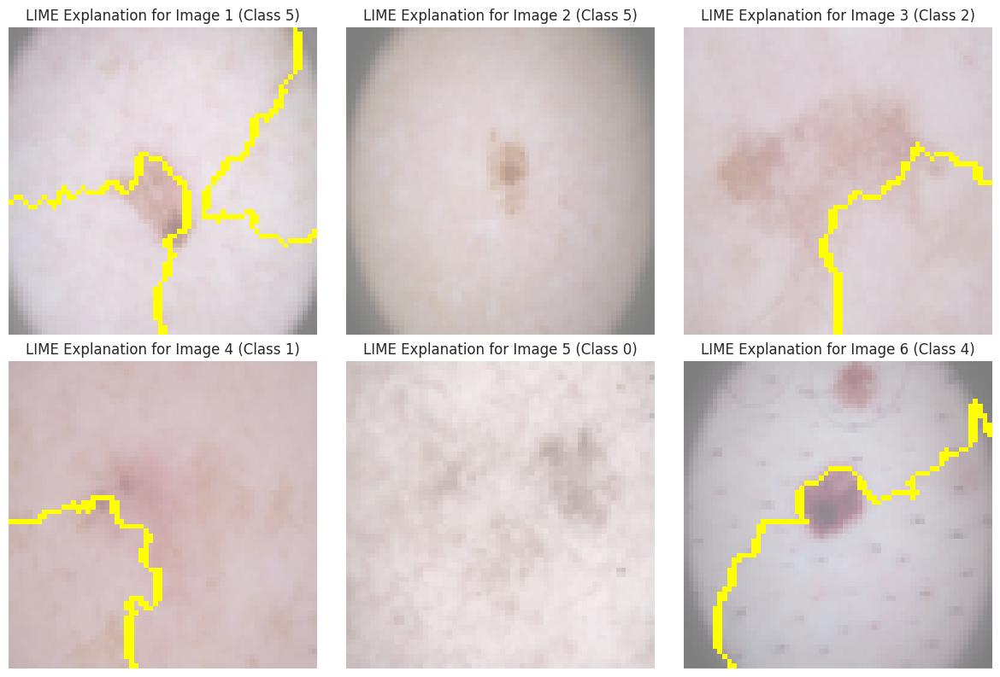

In [ ]:
import numpy as np
from lime import lime_image
from skimage.segmentation import mark_boundaries
import matplotlib.pyplot as plt

# Initialize the LIME Image Explainer
explainer = lime_image.LimeImageExplainer()

# Function to Generate and Display LIME Explanations for 6 Images in a 2x3 Grid
def display_lime_explanations(images, model, num_images=6):
    plt.figure(figsize=(12, 8))  # Set the figure size for a 2x3 grid

    for i in range(num_images):
        # Select an image from the test set
        image = images[i]

        # Generate the LIME explanation
        explanation = explainer.explain_instance(
            image,
            classifier_fn=lambda x: model.predict(x),  # Prediction function
            top_labels=3,
            hide_color=0,
            num_samples=1000
        )

        # Get explanation for the top predicted class
        top_label = explanation.top_labels[0]
        temp, mask = explanation.get_image_and_mask(
            label=top_label,
            positive_only=True,
            hide_rest=False,
            num_features=5,
            min_weight=0.1
        )

        # Plot each image in a 2x3 grid
        plt.subplot(2, 3, i + 1)
        plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))
        plt.title(f"LIME Explanation for Image {i+1} (Class {top_label})")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Display LIME explanations for the first 6 images in the test set
display_lime_explanations(x_test, model, num_images=6)


SHAP

In [ ]:
pip install shap


In [ ]:
pip install --upgrade shap


In [ ]:
pip install --upgrade shap matplotlib tensorflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.3/8.3 MB 56.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 615.3/615.3 MB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 111.6 MB/s eta 0:00:00
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.17.1
    Uninstalling tensorboard-2.17.1:
      Successfully uninstalled tensorboard-2.17.1
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.8.0
    Uninstalling matplotlib-3.8.0:
      Successfully uninstalled matplotlib-3.8.0
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.17.1
    Uninstalling tensorflow-2.17.1:
      Successfully uninstalled tensorflow-2.17.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tf-keras 2.17.0 requires tensorflow<2.18,>=2.17, but you have tensorflow 2.1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


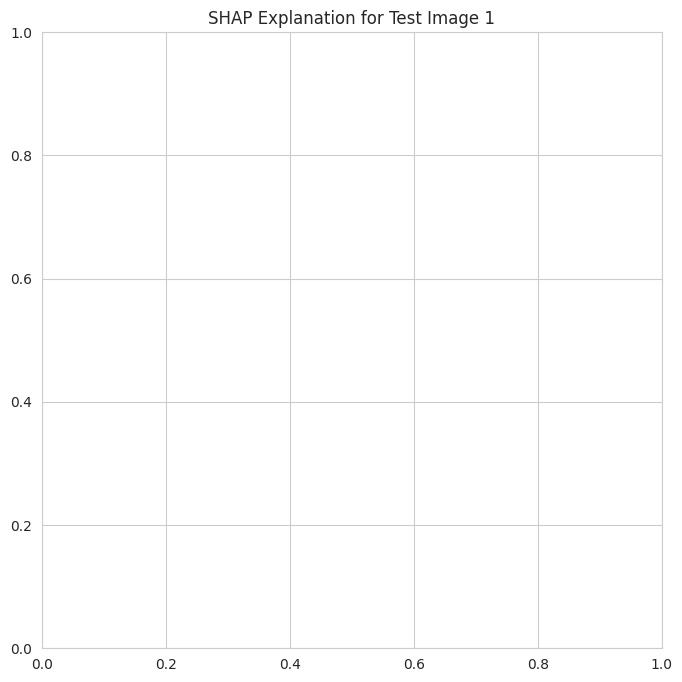

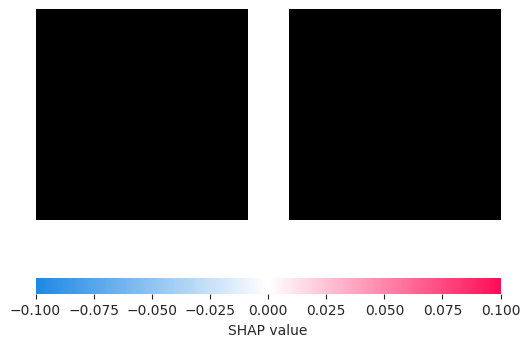

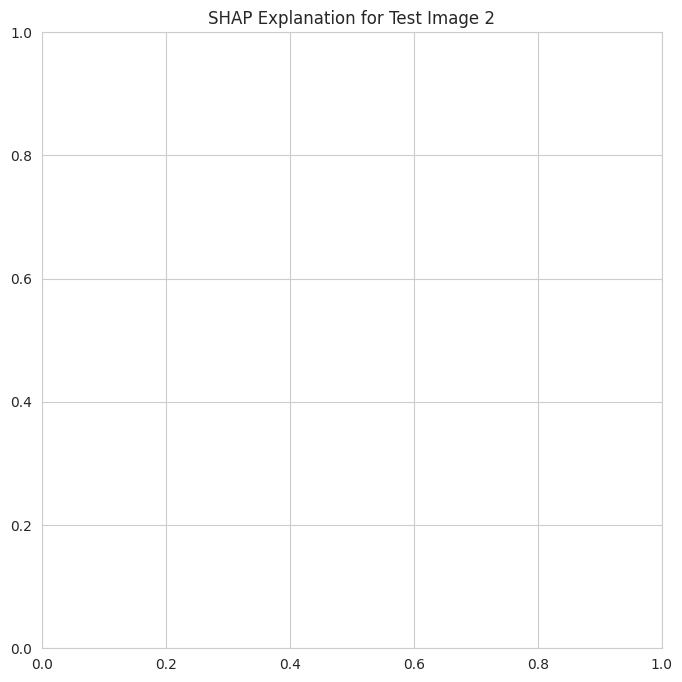

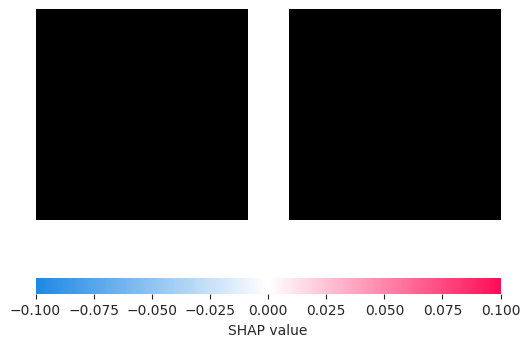

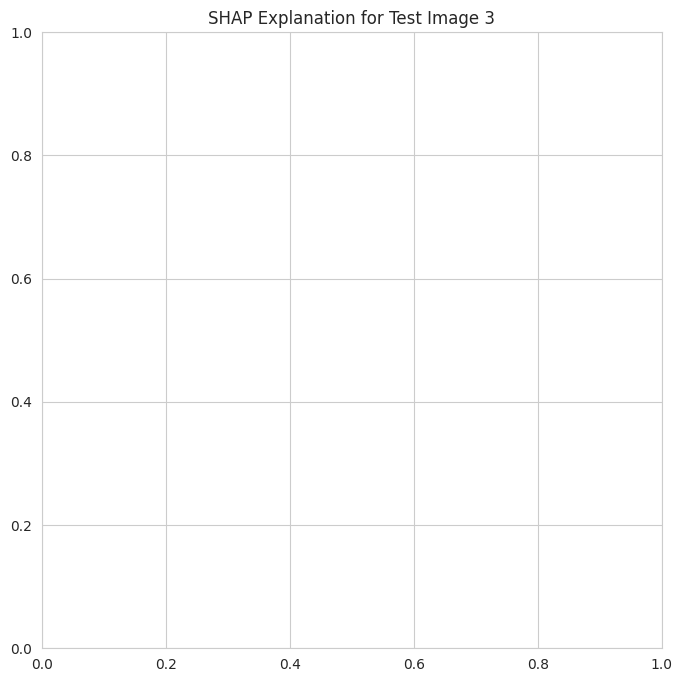

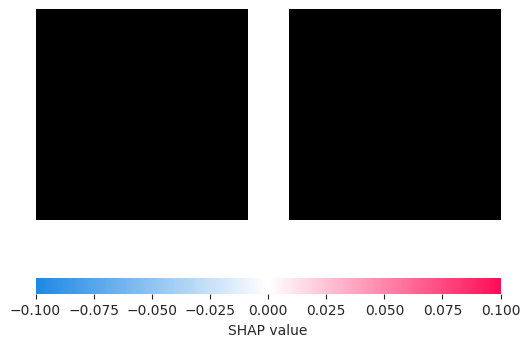

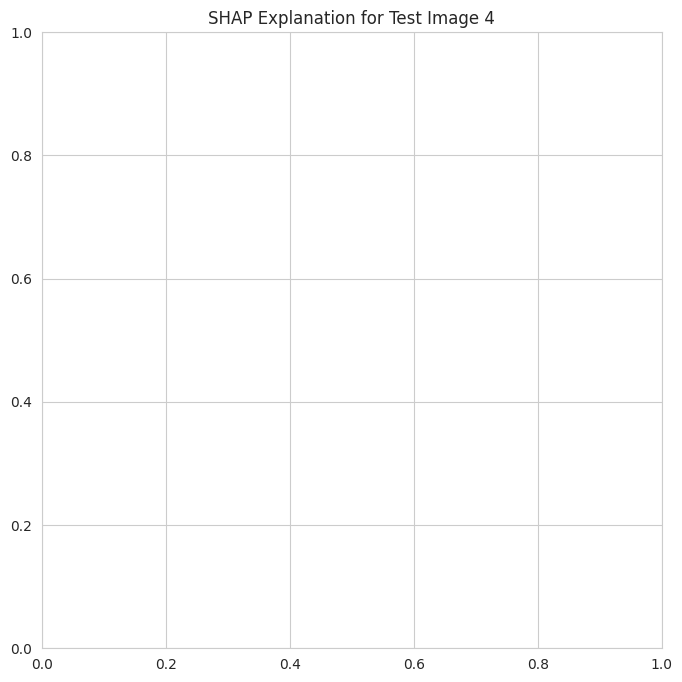

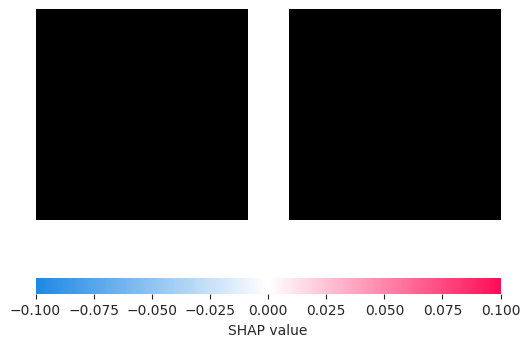

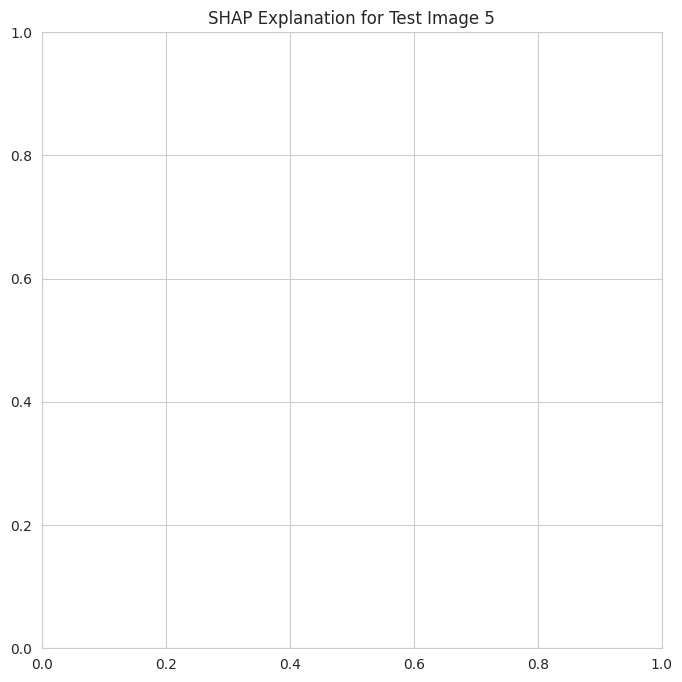

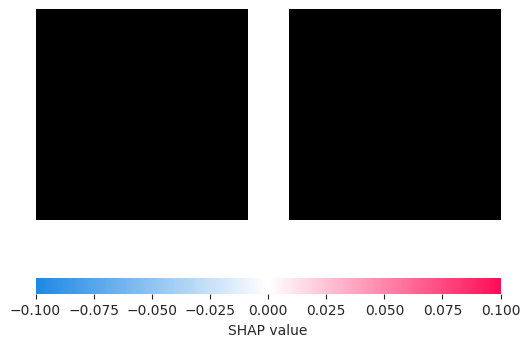

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPooling2D
import shap
import matplotlib.pyplot as plt
import numpy as np

# Define the model
model = tf.keras.models.load_model("/content/Quantized_Student.tflite")

# Compile the model
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Normalize training and test data
x_train = x_train.astype('float32') / 255.0
x_test = x_test.astype('float32') / 255.0

# Train the model (assuming x_train and y_train are pre-loaded)
#model.fit(x_train, y_train, epochs=100, batch_size=32, validation_split=0.2)

# Selecting a small subset for the SHAP explainer
sample_data = x_train[:100]
explainer = shap.DeepExplainer(model, sample_data)

# Select some test images to explain
test_samples = x_test[:5]

# Ensure the test_samples are normalized
test_samples = test_samples.astype('float32') / 255.0

# Generate SHAP values
shap_values = explainer.shap_values(test_samples)

# Plotting the SHAP explanations
for i in range(len(test_samples)):
    plt.figure(figsize=(8, 8))
    plt.title(f"SHAP Explanation for Test Image {i + 1}")

    # Reshape SHAP values to match input image dimensions (64, 64, 3)
    shap.image_plot([shap_values], -test_samples[i:i+1])




SHAP values shape: [64]


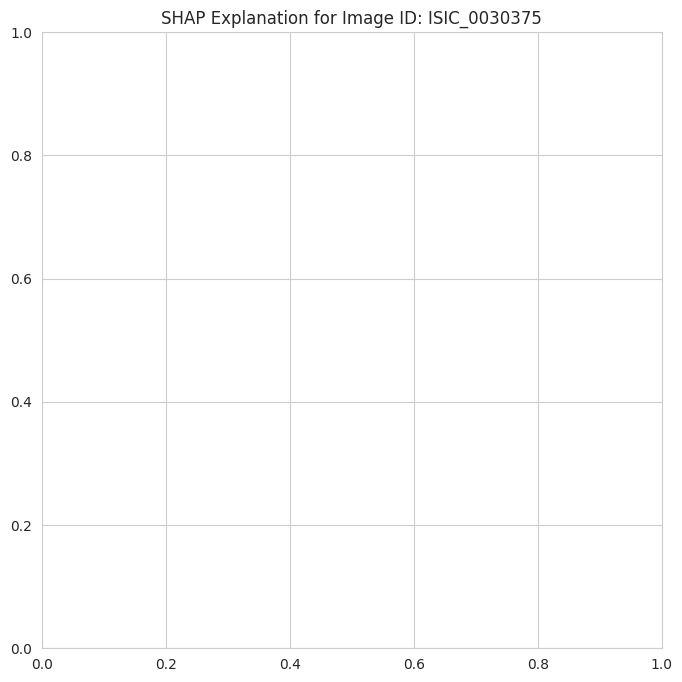

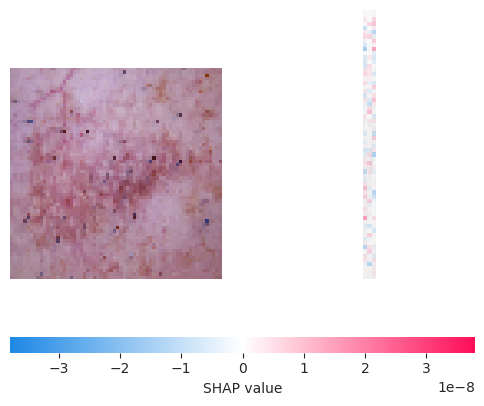

In [ ]:
import os
import numpy as np
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import img_to_array
from glob import glob
import shap
import matplotlib.pyplot as plt

# Directory where images are stored
base_skin_dir = '/content/ham10000'

# Use glob to get a list of file paths
image_paths = glob(os.path.join(base_skin_dir, '*', '*.jpg'))

# Create a dictionary mapping image IDs to file paths
imageid_path_dict = {os.path.splitext(os.path.basename(x))[0]: x for x in image_paths}

# Select one image path to load (using the first image in this case)
image_id = list(imageid_path_dict.keys())[0]
image_path = imageid_path_dict[image_id]

# Load and preprocess the image
img = image.load_img(image_path, target_size=(64, 64))  # Resize image to match model input
img_array = img_to_array(img).astype('float32') / 255.0  # Convert to numpy array and normalize

# Add an extra dimension to make it a batch of 1 image (1, 64, 64, 3)
img_array = np.expand_dims(img_array, axis=0)

# Assuming 'explainer' is already defined and trained using the training data
# Generate SHAP values for the image (this should be done for the entire batch, here we use a batch of 1)
shap_values = explainer.shap_values(img_array)

# Check the length of shap_values (it should be the number of classes, e.g., 7 for multi-class classification)
print("SHAP values shape:", [len(sv) for sv in shap_values])  # Prints the number of explanations for each class

# Plot SHAP explanation for the image
plt.figure(figsize=(8, 8))
plt.title(f"SHAP Explanation for Image ID: {image_id}")

# Plot SHAP explanation using the reshaped image and SHAP values
# shap_values[0] corresponds to the SHAP values for the first class, adjust according to your class of interest
shap.image_plot([shap_values[0]], img_array)


**SCORE CAM**

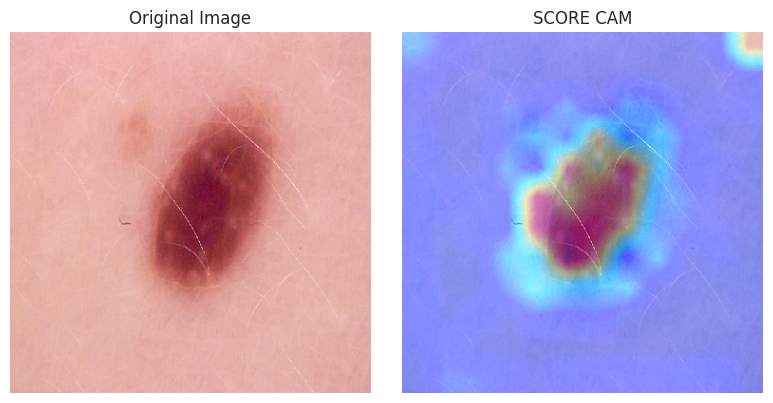

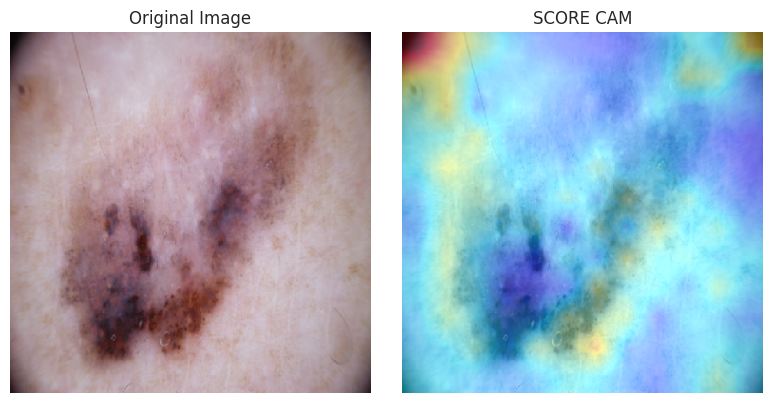

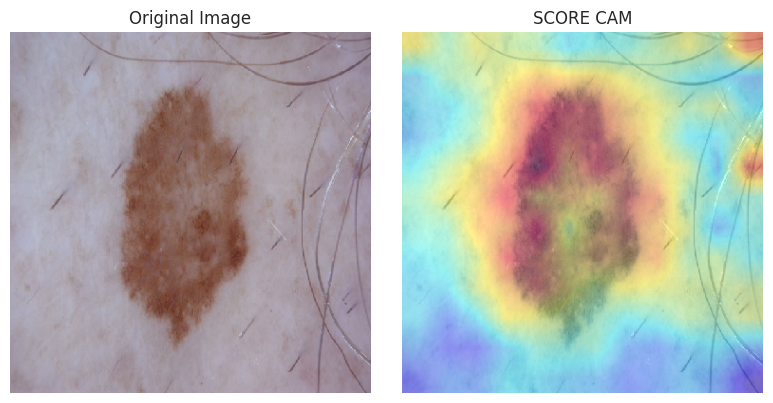

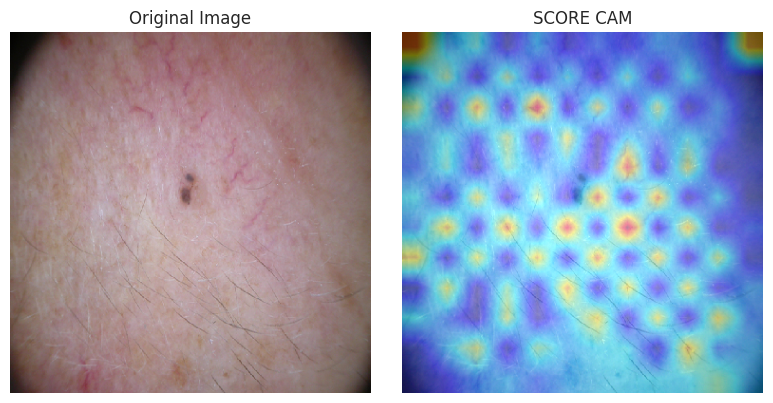

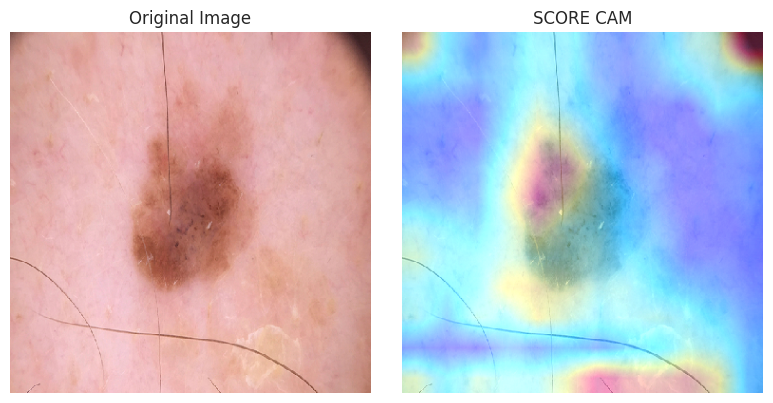

In [ ]:
import os
import numpy as np
import cv2
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
from glob import glob
import random

# Improved grad_cam function with Guided Backpropagation
def grad_cam(model, img_path, layer_name, class_idx, preprocess_input):
    img = image.load_img(img_path, target_size=(380, 380))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)

    grad_model = Model([model.inputs], [model.get_layer(layer_name).output, model.output])
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, class_idx]

    grads = tape.gradient(loss, conv_outputs)
    guided_grads = tf.cast(conv_outputs > 0, 'float32') * tf.cast(grads > 0, 'float32') * grads
    pooled_grads = tf.reduce_mean(guided_grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]

    # Convert to numpy arrays
    conv_outputs = conv_outputs.numpy()
    pooled_grads = pooled_grads.numpy()

    # Apply weights to the convolutional outputs
    for i in range(pooled_grads.shape[-1]):
        conv_outputs[:, :, i] *= pooled_grads[i]

    # Compute the heatmap
    heatmap = np.mean(conv_outputs, axis=-1)
    heatmap = np.maximum(heatmap, 0)

    # Resize heatmap to the size of the input image
    heatmap = cv2.resize(heatmap, (img_array.shape[2], img_array.shape[1]))

    # Normalize the heatmap
    heatmap /= np.max(heatmap)
    heatmap = np.uint8(255 * heatmap)

    return heatmap

# Define image directory and other parameters
base_skin_dir = '/content/ham10000'
image_paths = glob(os.path.join(base_skin_dir, '*', '*.jpg'))
class_index = 5  # Replace with the index of the class for which you want to visualize GRAD CAM

# Preprocess input image function
preprocess_func = tf.keras.applications.efficientnet.preprocess_input

# Load pre-trained EfficientNet model
model = tf.keras.models.load_model("/content/Quantized_Student.tflite")
last_conv_layer_name = 'top_conv'  # EfficientNetB4's last conv layer name

# Shuffle the image paths to get different images every time
random.shuffle(image_paths)

# Process up to 5 images and display
num_images_to_display = 5
num_images_processed = 0

for img_path in image_paths:
    try:
        # Compute GRAD CAM
        cam = grad_cam(model, img_path, last_conv_layer_name, class_index, preprocess_func)

        # Normalize the original image for display
        img = image.load_img(img_path, target_size=(380, 380))
        img = image.img_to_array(img)
        img = img.astype(np.float32) / 255.0

        # Resize the heatmap to match the image size
        heatmap = cv2.applyColorMap(cam, cv2.COLORMAP_JET)

        # Adjust the blending ratio to make the original image more visible
        superimposed_img = cv2.addWeighted(img, 0.8, heatmap.astype('float32') / 255.0, 0.4, 0)

        # Display the original image and GRAD CAM
        plt.figure(figsize=(8, 4))
        plt.subplot(1, 2, 1)
        plt.imshow(img)
        plt.title('Original Image')
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB))
        plt.title('SCORE CAM')
        plt.axis('off')

        plt.tight_layout()
        plt.show()

        num_images_processed += 1
        if num_images_processed >= num_images_to_display:
            break  # Stop after displaying the required number of images

    except Exception as e:
        print(f"Error processing image {img_path}: {e}")
        continue


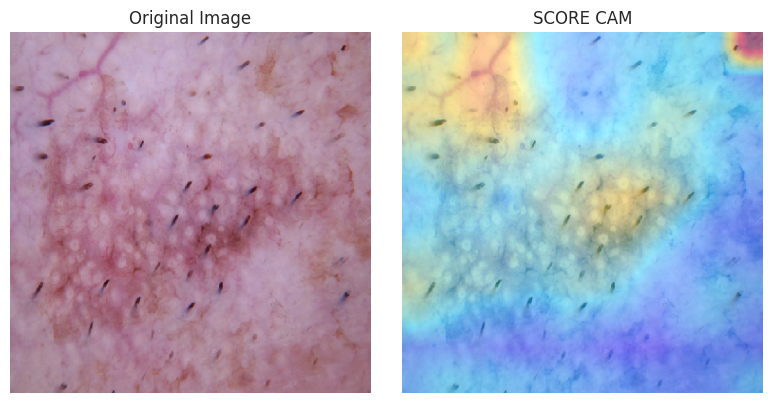

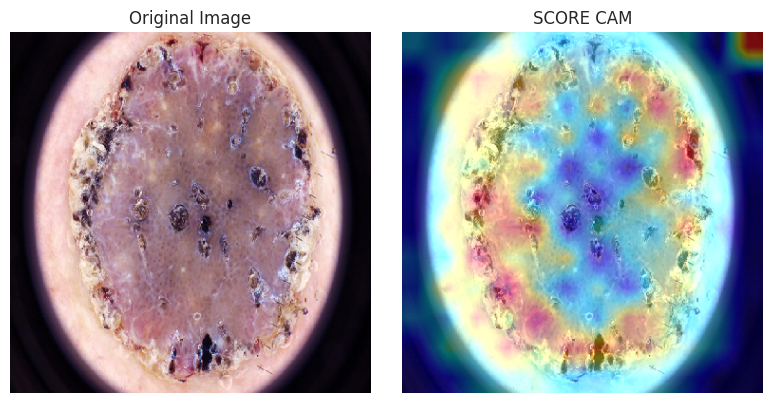

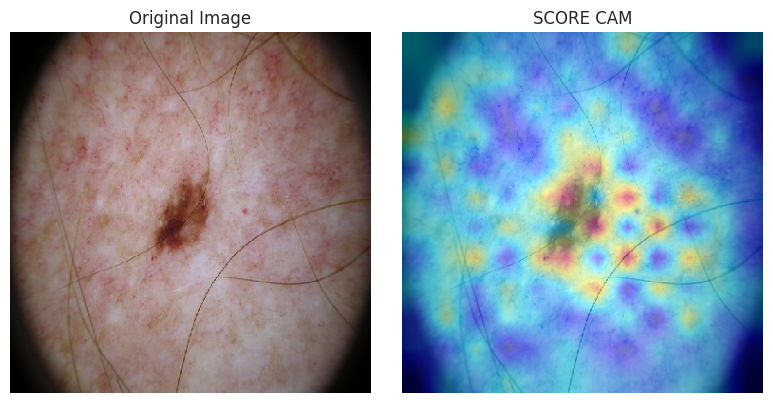

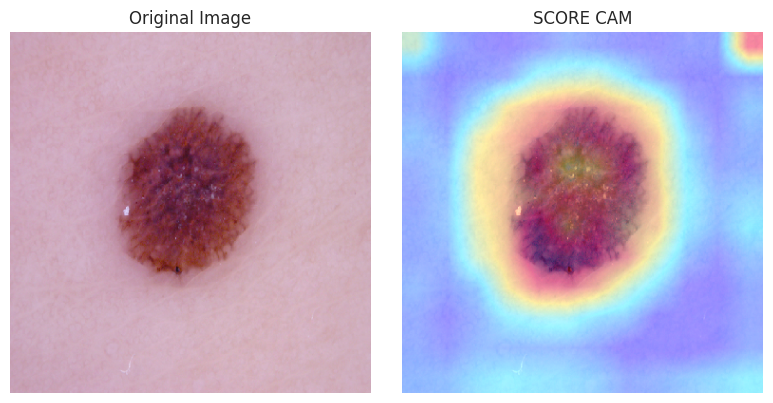

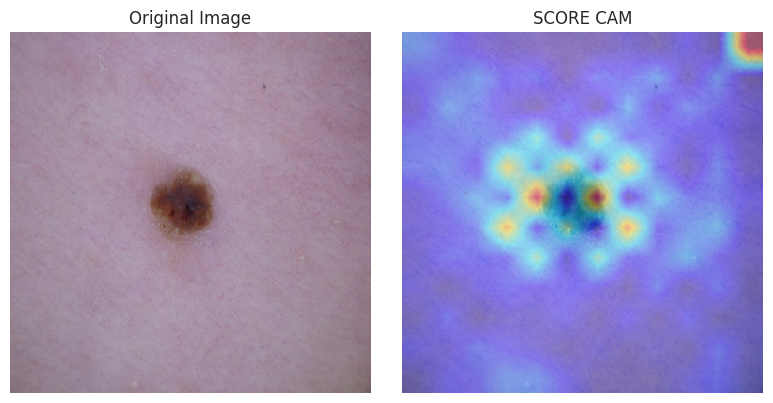

In [ ]:
import os
import numpy as np
import cv2
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
from glob import glob

# Improved grad_cam function with Guided Backpropagation
def grad_cam(model, img_path, layer_name, class_idx, preprocess_input):
    img = image.load_img(img_path, target_size=(380, 380))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)

    grad_model = Model([model.inputs], [model.get_layer(layer_name).output, model.output])
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, class_idx]

    grads = tape.gradient(loss, conv_outputs)
    guided_grads = tf.cast(conv_outputs > 0, 'float32') * tf.cast(grads > 0, 'float32') * grads
    pooled_grads = tf.reduce_mean(guided_grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]

    # Convert to numpy arrays
    conv_outputs = conv_outputs.numpy()
    pooled_grads = pooled_grads.numpy()

    # Apply weights to the convolutional outputs
    for i in range(pooled_grads.shape[-1]):
        conv_outputs[:, :, i] *= pooled_grads[i]

    # Compute the heatmap
    heatmap = np.mean(conv_outputs, axis=-1)
    heatmap = np.maximum(heatmap, 0)

    # Resize heatmap to the size of the input image
    heatmap = cv2.resize(heatmap, (img_array.shape[2], img_array.shape[1]))

    # Normalize the heatmap
    heatmap /= np.max(heatmap)
    heatmap = np.uint8(255 * heatmap)

    return heatmap

# Define image directory and other parameters
base_skin_dir = '/content/ham10000'
image_paths = glob(os.path.join(base_skin_dir, '*', '*.jpg'))
class_index = 5  # Replace with the index of the class for which you want to visualize GRAD CAM

# Preprocess input image function
preprocess_func = tf.keras.applications.efficientnet.preprocess_input

# Load pre-trained EfficientNet model
model = tf.keras.models.load_model("/content/Quantized_Student.tflite")
last_conv_layer_name = 'top_conv'  # EfficientNetB4's last conv layer name

# Process up to 5 images and display
num_images_to_display = 5
num_images_processed = 0

for img_path in image_paths:
    try:
        # Compute GRAD CAM
        cam = grad_cam(model, img_path, last_conv_layer_name, class_index, preprocess_func)

        # Normalize the original image for display
        img = image.load_img(img_path, target_size=(380, 380))
        img = image.img_to_array(img)
        img = img.astype(np.float32) / 255.0

        # Resize the heatmap to match the image size
        heatmap = cv2.applyColorMap(cam, cv2.COLORMAP_JET)

        # Adjust the blending ratio to make the original image more visible
        superimposed_img = cv2.addWeighted(img, 0.8, heatmap.astype('float32') / 255.0, 0.4, 0)

        # Display the original image and GRAD CAM
        plt.figure(figsize=(8, 4))
        plt.subplot(1, 2, 1)
        plt.imshow(img)
        plt.title('Original Image')
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB))
        plt.title('SCORE CAM')
        plt.axis('off')

        plt.tight_layout()
        plt.show()

        num_images_processed += 1
        if num_images_processed >= num_images_to_display:
            break

    except Exception as e:
        print(f"Error processing image {img_path}: {e}")
        continue
